# Task 2 · Evidence and study notebook
### Unsupervised domain adaptation: alignment, recognition, and failure analysis

This notebook explains the six Task 2 steps, displays actual PACS examples, and reorganizes completed results into tables and exportable figures. It reads only the current `Task 2` repository and root `data/PACS`. It **does not train, select new checkpoints, rerun adaptation, or modify experiment outputs**. New files go only to `report_assets/` beside this notebook.

**Run:** restart the existing `Python (pa1_env)` kernel and Run All. Executed outputs are included. PNG/SVG figures and CSV tables are indexed in `report_assets/asset_index.csv`; `source_manifest.csv` records source hashes.

**Two experiment families:** the original six runs contain the required four-method comparison and controlled DAN-strength study. Recovery v1 contains three follow-up runs with changed initialization, learning rates, BatchNorm policy, gradient clipping, scheduling, and selection timing. Recovery followed inspection of original target results. It is a separate, retrospective experiment, **not** a replacement controlled comparison or a fresh blind test.

**Assignment:** `ATML_PA1.pdf`, pp. 5–8 (Task 2), pp. 16–17 (Task 5/submission), p. 1 (AI policy). The manual requires your report language, interpretation, and analysis to be your own. Use these code explanations, measurements, and mechanism prompts to study the evidence; write your own report conclusions.

In [1]:
from pathlib import Path
import json, hashlib, sys
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from PIL import Image as PILImage
from torchvision import transforms
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
from IPython.display import display, Markdown, Image

TASK=next((q for p in [Path.cwd(),*Path.cwd().parents] for q in (p,p/'task2',p/'Task 2/task2')
           if (q/'results/source_only/config.json').is_file() and (q/'configs/base.yaml').is_file()),None)
if TASK is None:raise FileNotFoundError('Run from PA1, Task 2, or within Task 2/task2.')
TASK=TASK.resolve();PA1=TASK.parent.parent;RESULTS=TASK/'results';DATA=PA1/'data/PACS';OUT=TASK/'report_assets'
OUT.mkdir(exist_ok=True)
plt.rcParams.update({'font.size':10,'axes.spines.top':False,'axes.spines.right':False,
                     'axes.titleweight':'bold','figure.facecolor':'white','savefig.facecolor':'white'})
RUNS={'Source-only':'source_only','DAN':'dan','DANN':'dann','CDAN':'cdan',
      'DAN λ=0.1':'dan_lambda_0p1','DAN λ=10':'dan_lambda_10'}
ALIASES={'DAN lambda=0.1':'DAN λ=0.1','DAN lambda=10':'DAN λ=10'}
MAIN=['Source-only','DAN','DANN','CDAN'];ALL=list(RUNS)
REC={'DANN recovery':'dann','CDAN recovery':'cdan','DAN λ=10 recovery':'dan_lambda_10'}
COLORS=dict(zip(ALL,['#444444','#0072B2','#D55E00','#009E73','#CC79A7','#E69F00']))
DOMAINS=['photo','art_painting','cartoon']
assets=[];sources=set()
def read_json(p):
    p=Path(p);sources.add(p);return json.loads(p.read_text(encoding='utf-8'))
def read_csv(rel):
    p=RESULTS/rel;sources.add(p);return pd.read_csv(p)
def table(df,name,purpose):
    df.to_csv(OUT/(name+'.csv'),index=False);assets.append(dict(file=name+'.csv',purpose=purpose));display(df.round(3))
def figure(fig,name,purpose):
    for suffix in ['png','svg']:
        fig.savefig(OUT/(name+'.'+suffix),dpi=220,bbox_inches='tight');assets.append(dict(file=name+'.'+suffix,purpose=purpose))
    plt.close(fig);display(Image(filename=str(OUT/(name+'.png'))))
def sha(p):
    h=hashlib.sha256()
    with Path(p).open('rb') as f:
        for b in iter(lambda:f.read(8*1024*1024),b''):h.update(b)
    return h.hexdigest()
split=read_json(TASK.parent/'shared/splits/pacs_sketch_seed6304.json')
CLASSES=[k for k,v in sorted(split['class_to_idx'].items(),key=lambda kv:kv[1])]
comparison=read_csv('final_evaluation/comparison.csv').replace({'method':ALIASES})
predictions=read_csv('final_evaluation/target_predictions.csv').replace({'method':ALIASES})
per_class=read_csv('final_evaluation/per_class.csv').replace({'method':ALIASES})
histories={m:read_csv(f'{run}/history.csv') for m,run in RUNS.items()}
configs={m:read_json(RESULTS/run/'config.json')['config'] for m,run in RUNS.items()}
completed={m:read_json(RESULTS/run/'completion.json') for m,run in RUNS.items()}
source_metrics={m:read_csv(f'{run}/source_validation.csv') for m,run in RUNS.items()}
rec_pred=read_csv('recovery_v1/final_evaluation/target_predictions.csv')
rec_saved=read_csv('recovery_v1/final_evaluation/comparison.csv')
rec_hist={m:read_csv(f'recovery_v1/{run}/history.csv') for m,run in REC.items()}
rec_config={m:read_json(RESULTS/'recovery_v1'/run/'config.json')['config'] for m,run in REC.items()}
rec_done={m:read_json(RESULTS/'recovery_v1'/run/'completion.json') for m,run in REC.items()}
rec_source={m:read_csv(f'recovery_v1/{run}/source_validation.csv') for m,run in REC.items()}
base_pred=predictions[predictions.method=='Source-only'].sort_values('path').reset_index(drop=True)
target_paths=base_pred.path.tolist();truth=base_pred.label.to_numpy()
for m in ALL:
    p=predictions[predictions.method==m].sort_values('path').reset_index(drop=True)
    assert p.path.tolist()==target_paths and np.array_equal(p.label,truth)
    row=comparison.set_index('method').loc[m]
    assert np.isclose(accuracy_score(p.label,p.predicted_label),row.target_accuracy)
    assert np.isclose(f1_score(p.label,p.predicted_label,labels=range(7),average='macro'),row.target_macro_f1)
    assert np.isclose(source_metrics[m].accuracy.mean(),row.mean_source_accuracy)
    assert np.isclose(source_metrics[m].macro_f1.mean(),row.mean_source_macro_f1)
    assert completed[m]['best_epoch'] in histories[m].epoch.values
for m,run in REC.items():
    p=rec_pred[rec_pred.run==run].sort_values('path').reset_index(drop=True)
    assert p.path.tolist()==target_paths and np.array_equal(p.label,truth)
    assert np.isclose(accuracy_score(p.label,p.predicted_label),rec_saved.set_index('run').loc[run,'sketch_accuracy'])
for domain in DOMAINS:
    parts=split['domains'][domain]
    assert set(r['path'] for r in parts['train']).isdisjoint(r['path'] for r in parts['val'])
print('Verified saved target accuracies/macro-F1, common target IDs, source means, and source split separation.')
print('Target images:',len(target_paths),'| Python:',sys.executable,'| Exports:',OUT)


Verified saved target accuracies/macro-F1, common target IDs, source means, and source split separation.
Target images: 3929 | Python: C:\Users\Taha\miniconda3\envs\pa1_env\python.exe | Exports: D:\LUMS GAMING\6. 2026 Fall\CS 6304\Programming Assignments\PA1\Task 2\task2\report_assets


## 1. What is Task 2 doing, and how?

PACS has seven shared classes in four domains. **Photo, Art Painting, and Cartoon supply class-labeled training data. Sketch supplies images without class labels during adaptation.** The task asks whether using that unlabeled target structure improves Sketch recognition without losing class information learned from the sources.

All original methods fine-tune an ImageNet-initialized ResNet-18 (`ResNet18_Weights.IMAGENET1K_V1`) with a seven-output linear head. The vector before that head is 512-dimensional. Source-only learns from labeled sources. DAN adds a feature-distribution discrepancy; DANN learns a competing domain classifier; CDAN conditions that adversary on class probabilities.

This is **transductive adaptation**: the Sketch images evaluated at the end are visible, without class labels, during adaptation. They are not an image-held-out target test set. Source-only does not consume them during training. Target labels are used only for final analysis after decisions are fixed. Source validation, not target performance, selects checkpoints.

### Original shared recipe

- Separate stratified 80/20 source splits, seed 6304; same split reused by Task 3.
- Each update: 8 labeled images from each source (24 total); adaptation adds 24 unlabeled target images. Short loaders are cycled.
- Resize to 256×256; random 224×224 crop and horizontal flip during training; center crop during validation/evaluation; ImageNet channel normalization.
- AdamW, learning rate 1e-4, weight decay 1e-4; at most 30 source epochs; patience 5 on **unweighted mean source-domain macro-F1**.
- A source epoch uses `ceil(largest source training set / 8)` balanced updates. Epoch counts therefore do not mean a single pass through every smaller domain.
- BatchNorm running means/variances stay at ImageNet values; scale/bias remain trainable in the original runs. Fine-tuning the model is distinct from updating its BatchNorm running statistics.
- Every original run starts from ImageNet initialization, not from the trained source-only checkpoint. The recovery family changes this.

The domain gap below compares mean source-validation accuracy with target accuracy. These are different populations; it is a descriptive gap, not a paired causal effect.

In [2]:
counts=[]
for domain in DOMAINS:
    for part in ['train','val']:
        records=split['domains'][domain][part]
        for label,cls in enumerate(CLASSES):counts.append(dict(domain=domain,partition=part,class_name=cls,count=sum(r['label']==label for r in records)))
for label,cls in enumerate(CLASSES):counts.append(dict(domain='sketch',partition='unlabeled adaptation / final analysis',class_name=cls,count=int(sum(truth==label))))
table(pd.DataFrame(counts),'01_split_counts','Class counts; Sketch labels shown for final reporting only')
table(pd.DataFrame(counts).groupby(['domain','partition'],sort=False)['count'].sum().reset_index(),'01_split_totals','Source train/validation and complete target counts')
rows=[]
for m in ALL:
    d=completed[m]
    rows.append(dict(method=m,initialization='ImageNet',epochs_run=d['completed_epochs'],selected_epoch=d['best_epoch'],
                     selected_source_macro_f1_pct=100*d['best_source_macro_f1'],target_seen_unlabeled=m!='Source-only'))
table(pd.DataFrame(rows),'02_original_run_protocol','Saved selected epochs and training durations')


,domain,partition,class_name,count
0,photo,train,dog,151
1,photo,train,elephant,161
2,photo,train,giraffe,146
3,photo,train,guitar,149
4,photo,train,horse,159
5,photo,train,house,224
6,photo,train,person,346
7,photo,val,dog,38
8,photo,val,elephant,41
9,photo,val,giraffe,36


,domain,partition,count
0,photo,train,1336
1,photo,val,334
2,art_painting,train,1638
3,art_painting,val,410
4,cartoon,train,1875
5,cartoon,val,469
6,sketch,unlabeled adaptation / final analysis,3929


,method,initialization,epochs_run,selected_epoch,selected_source_macro_f1_pct,target_seen_unlabeled
0,Source-only,ImageNet,9,4,93.741,False
1,DAN,ImageNet,10,5,93.940,True
2,DANN,ImageNet,7,2,16.035,True
3,CDAN,ImageNet,8,3,32.756,True
4,DAN λ=0.1,ImageNet,17,12,95.613,True
5,DAN λ=10,ImageNet,6,1,5.067,True


## 2. What each step does and produces

| Step | Mechanism | Saved artifact and what it establishes |
|---|---|---|
| 1 · Source-only ERM | Cross-entropy on the pooled, domain-balanced labeled sources. | `source_only/best.pt`, source metrics and history. Reused unchanged as Task 3 ERM. |
| 2 · DAN | Class loss plus λ × MMD between 512-D source and target features; λ=1 in the main comparison. | `dan/` checkpoint, classification/MMD curves and final predictions. Marginal alignment does not know target classes. |
| 3 · DANN | A 512→256→2 domain discriminator (ReLU, dropout 0.5) learns source versus target; gradient reversal sends the opposite feature gradient. | `dann/` checkpoint, class/domain losses, discriminator accuracy, GRL schedule. Chance domain accuracy alone cannot establish successful transfer. |
| 4 · CDAN | Feed the full feature–probability outer product to the same discriminator design: 512×7=3,584 inputs. Both features and probabilities retain gradients; no entropy conditioning. | `cdan/` checkpoint and the same diagnostics. Predicted class information can be useful or misleading. |
| 5 · Common evaluation | Lock models; report source/Sketch metrics, class errors, and a separately fitted held-out domain probe. | `final_evaluation/`: comparison, per-class metrics, confusions, target predictions, probe split, image manifest and lock. |
| 6 · Controlled design | Original DAN at λ∈{0.1,1,10}; all other saved recipe fields held fixed. | `dan_lambda_0p1/`, `dan/`, `dan_lambda_10/`. Study the invariance/discriminability trade-off without target-based retuning. |

**DAN implementation:** biased empirical squared MMD including diagonal kernel terms. Sum three kernels `exp(-distance_squared / (scale × median_distance_squared))`, scales 0.5, 1, 2. The batch median uses unique off-diagonal source+target pairs and is detached; gradients still flow through both feature sets. Features are not normalized for MMD.

**DANN/CDAN objective:** class cross-entropy plus domain cross-entropy with unit domain-loss weight. The backbone receives a reversed domain gradient scaled by `α(p)=2/(1+exp(-10p))-1`. The discriminator minimizes ordinary domain loss. CDAN's conditioning uses softmax probabilities, not target ground-truth labels.

**Probe versus discriminator:** the final domain-separability score comes from a new standardized logistic-regression probe (`C=1`, balanced class weight, seed 6304), trained on a balanced 70/30 source-validation/target feature split with the backbone frozen. It is not the online adversary accuracy. Lower probe accuracy means domain information is harder for this particular probe to recover; it does not prove useful semantic alignment.

## 3. Real PACS examples and same-image augmentation

The domain grid aligns **classes**, not identical photographs: PACS domain examples are different images. Source rows use saved training IDs; the Sketch row comes from the final target inventory. Target class names are shown for this completed analysis, not supplied to adaptation.

The augmentation panel separately reuses exactly one source image and one target image across columns. The three seeded random crop/flip views reproduce the **recipe**, not particular minibatches from training. Normalization is omitted from display so colors remain interpretable. These are visual examples, not extra evaluation observations.

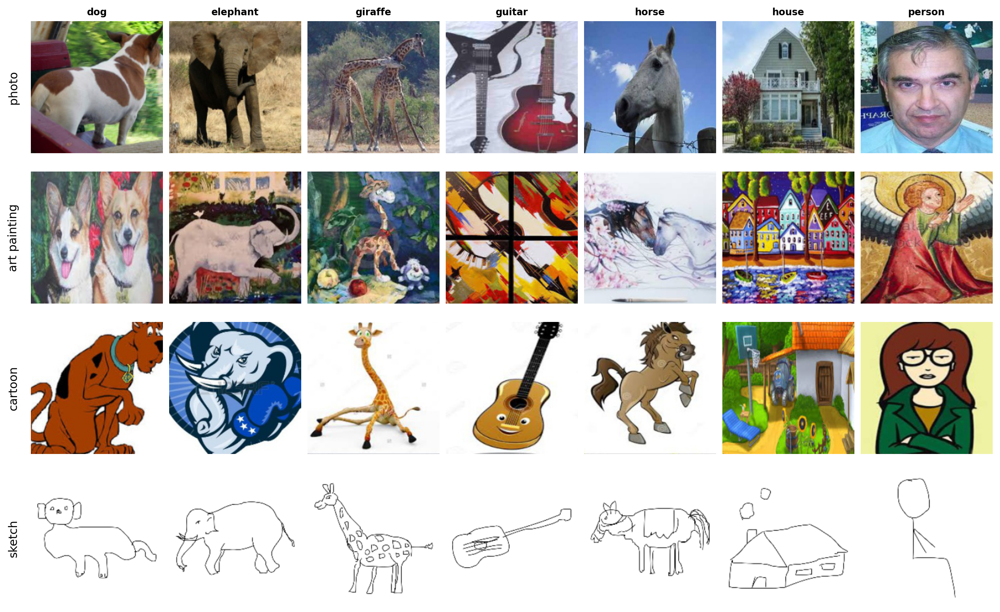

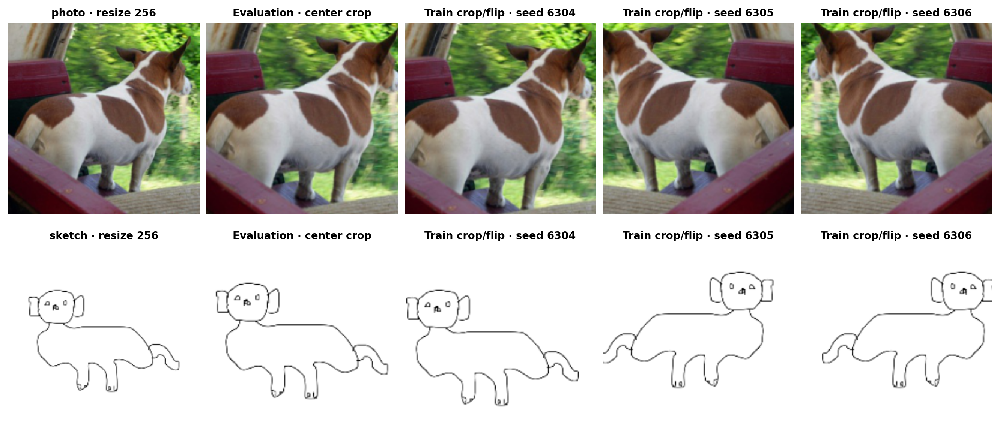

,panel,domain,path,class_name
0,domain grid,photo,photo/dog/n02103406_8004.jpg,dog
1,domain grid,photo,photo/elephant/n02503517_3799.jpg,elephant
2,domain grid,photo,photo/giraffe/084_0057.jpg,giraffe
3,domain grid,photo,photo/guitar/063_0025.jpg,guitar
4,domain grid,photo,photo/horse/105_0009.jpg,horse
5,domain grid,photo,photo/house/pic_068.jpg,house
6,domain grid,photo,photo/person/253_0090.jpg,person
7,domain grid,art_painting,art_painting/dog/pic_244.jpg,dog
8,domain grid,art_painting,art_painting/elephant/pic_205.jpg,elephant
9,domain grid,art_painting,art_painting/giraffe/pic_286.jpg,giraffe


In [3]:
image_records=[]
def load_rgb(path):
    p=DATA/path;sources.add(p)
    with PILImage.open(p) as im:return im.convert('RGB')
def show(ax,im,title):
    ax.imshow(im);ax.set_title(title,fontsize=9);ax.axis('off')
fig,axs=plt.subplots(4,7,figsize=(13,8),layout='constrained')
for i,domain in enumerate(DOMAINS+['sketch']):
    records=split['domains'][domain]['train'] if domain!='sketch' else base_pred[['path','label']].to_dict('records')
    for label,cls in enumerate(CLASSES):
        r=next(r for r in records if r['label']==label)
        im=transforms.CenterCrop(224)(transforms.Resize((256,256))(load_rgb(r['path'])))
        show(axs[i,label],im,cls if i==0 else '')
        if label==0:axs[i,label].text(-.09,.5,domain.replace('_',' '),rotation=90,ha='right',va='center',transform=axs[i,label].transAxes,fontsize=11)
        image_records.append(dict(panel='domain grid',domain=domain,path=r['path'],class_name=cls))
figure(fig,'03_pacs_domain_examples','Seven classes across three labeled source domains and the unlabeled target domain')
chosen=[next(r for r in image_records if r['domain']=='photo' and r['class_name']=='dog'),
        next(r for r in image_records if r['domain']=='sketch' and r['class_name']=='dog')]
fig,axs=plt.subplots(2,5,figsize=(12,5.4),layout='constrained')
augment=transforms.Compose([transforms.Resize((256,256)),transforms.RandomCrop(224),transforms.RandomHorizontalFlip()])
for i,r in enumerate(chosen):
    im=load_rgb(r['path']);resized=transforms.Resize((256,256))(im)
    show(axs[i,0],resized,r['domain']+' · resize 256')
    show(axs[i,1],transforms.CenterCrop(224)(resized),'Evaluation · center crop')
    for j,seed in enumerate([6304,6305,6306]):
        with torch.random.fork_rng(devices=[]):torch.manual_seed(seed);view=augment(im)
        show(axs[i,j+2],view,f'Train crop/flip · seed {seed}')
figure(fig,'04_same_image_augmentation','Same source and target image across evaluation and illustrative training views')
table(pd.DataFrame(image_records),'03_example_paths','Exact PACS file paths for the domain illustration')


## 4. Original four-method comparison and the domain gap

Rate columns are displayed as percentages; differences use percentage points. The compact overview is accompanied by the full source-domain table, including every domain's accuracy and macro-F1. Mean source metrics weight the three domains equally, not by image count. Sketch is class-imbalanced, so inspect accuracy **and** macro-F1.

,method,photo_accuracy_pct,photo_macro_f1_pct,art_painting_accuracy_pct,art_painting_macro_f1_pct,cartoon_accuracy_pct,cartoon_macro_f1_pct,mean_source_accuracy_pct,mean_source_macro_f1_pct,target_accuracy_pct,target_macro_f1_pct,domain_separability_pct,probe_train_count,probe_test_count,target_accuracy_change_pp
0,Source-only,96.707,95.976,90.000,90.005,94.883,95.242,93.863,93.741,69.152,69.725,99.863,1698,728,0.000
1,DAN,97.006,96.474,90.000,90.140,94.883,95.206,93.963,93.940,59.201,53.842,82.418,1698,728,-9.952
2,DANN,29.641,16.433,22.195,14.116,19.829,17.556,23.888,16.035,18.045,6.368,99.863,1698,728,-51.107
3,CDAN,52.994,35.244,40.488,31.673,39.232,31.350,44.238,32.756,2.087,0.650,99.176,1698,728,-67.065
4,DAN λ=0.1,97.006,96.595,93.659,93.820,95.949,96.424,95.538,95.613,69.432,65.307,92.720,1698,728,0.280
5,DAN λ=10,25.749,5.850,21.951,5.143,17.271,4.208,21.657,5.067,4.072,1.118,73.489,1698,728,-65.080


,method,mean_source_accuracy_pct,mean_source_macro_f1_pct,target_accuracy_pct,target_macro_f1_pct,target_accuracy_change_pp,domain_separability_pct
0,Source-only,93.863,93.741,69.152,69.725,0.000,99.863
1,DAN,93.963,93.940,59.201,53.842,-9.952,82.418
2,DANN,23.888,16.035,18.045,6.368,-51.107,99.863
3,CDAN,44.238,32.756,2.087,0.650,-67.065,99.176


,mean_source_accuracy_pct,target_accuracy_pct,source_minus_target_gap_pp
0,93.863,69.152,24.711


,domain,accuracy,macro_f1,loss,count,method
0,photo,0.967,0.960,0.092,334,Source-only
1,art_painting,0.900,0.900,0.385,410,Source-only
2,cartoon,0.949,0.952,0.182,469,Source-only
3,photo,0.970,0.965,0.115,334,DAN
4,art_painting,0.900,0.901,0.279,410,DAN
5,cartoon,0.949,0.952,0.157,469,DAN
6,photo,0.296,0.164,5.029,334,DANN
7,art_painting,0.222,0.141,4.840,410,DANN
8,cartoon,0.198,0.176,5.320,469,DANN
9,photo,0.530,0.352,1.220,334,CDAN


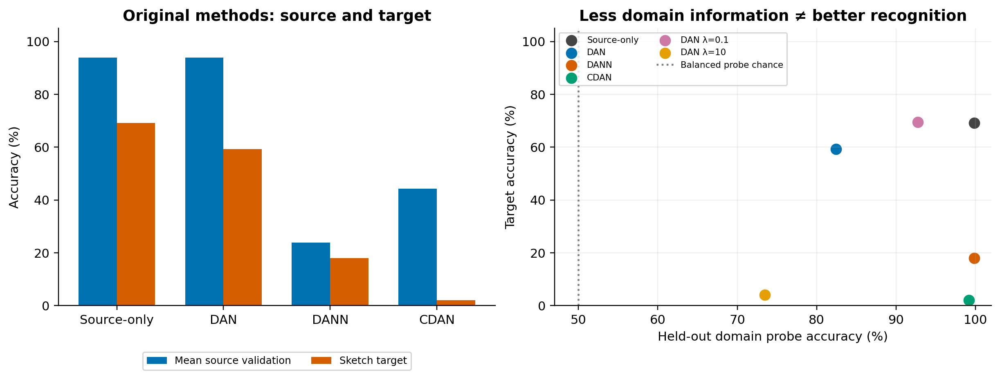

,domain_label,split,count
0,0,test,364
1,0,train,849
2,1,test,364
3,1,train,849


In [4]:
display_comparison=comparison.copy()
rate_cols=[c for c in display_comparison if c.endswith('accuracy') or c.endswith('macro_f1') or c=='domain_separability']
display_comparison[rate_cols]*=100
display_comparison=display_comparison.rename(columns={c:c+'_pct' for c in rate_cols})
table(display_comparison,'05_full_original_comparison','All source-domain, target, change and held-out probe results')
compact=display_comparison[['method','mean_source_accuracy_pct','mean_source_macro_f1_pct','target_accuracy_pct',
                            'target_macro_f1_pct','target_accuracy_change_pp','domain_separability_pct']]
table(compact[compact.method.isin(MAIN)],'05_main_comparison','Required four-method comparison')
base=comparison.set_index('method').loc['Source-only']
table(pd.DataFrame([dict(mean_source_accuracy_pct=100*base.mean_source_accuracy,target_accuracy_pct=100*base.target_accuracy,
                        source_minus_target_gap_pp=100*(base.mean_source_accuracy-base.target_accuracy))]),
      '06_source_target_gap','Descriptive source-only domain gap')
source_long=pd.concat([d.assign(method=m) for m,d in source_metrics.items()],ignore_index=True)
table(source_long,'06_source_domain_metrics','Source validation results by domain; original rate columns are fractions')
fig,axs=plt.subplots(1,2,figsize=(11,4.1),layout='constrained')
d=comparison.set_index('method').loc[MAIN];x=np.arange(4)
axs[0].bar(x-.18,100*d.mean_source_accuracy,.36,label='Mean source validation',color='#0072B2')
axs[0].bar(x+.18,100*d.target_accuracy,.36,label='Sketch target',color='#D55E00')
axs[0].set(xticks=x,xticklabels=MAIN,ylabel='Accuracy (%)',ylim=(0,105),title='Original methods: source and target')
axs[0].legend(loc='upper center',bbox_to_anchor=(.5,-.15),ncol=2,fontsize=8)
for m in ALL:
    row=comparison.set_index('method').loc[m]
    axs[1].scatter(100*row.domain_separability,100*row.target_accuracy,color=COLORS[m],s=65,label=m)
axs[1].axvline(50,color='gray',ls=':',label='Balanced probe chance')
axs[1].set(xlabel='Held-out domain probe accuracy (%)',ylabel='Target accuracy (%)',xlim=(47,102),ylim=(0,105),title='Less domain information ≠ better recognition')
axs[1].legend(fontsize=7,loc='upper left',ncol=2);axs[1].grid(alpha=.2)
figure(fig,'07_source_target_and_separability','Domain gap and relationship between held-out separability and recognition')
probe_split=read_csv('final_evaluation/probe_split.csv')
table(probe_split.groupby(['domain_label','split']).size().rename('count').reset_index(),'07_probe_split','Balanced held-out domain diagnostic sample counts: 0=source, 1=target')


## 5. Original learning curves and optimization diagnostics

All curves come from saved epoch histories. Stars identify the selected checkpoint; curves include later epochs before early stopping. There are no target-per-epoch curves because target labels must not select checkpoints. Training accuracy is measured on sampled/augmented source batches; validation is the unweighted three-domain mean.

Loss axes use a logarithmic scale where necessary to retain the original DANN spikes rather than cropping them away. Classification, MMD and domain cross-entropy are different quantities. The total loss includes method-specific terms, so lower total loss is not a common quality score. In accuracy panels, solid lines show source training accuracy and dashed lines show mean source-validation accuracy. The online domain accuracy is shown separately from the held-out probe above.

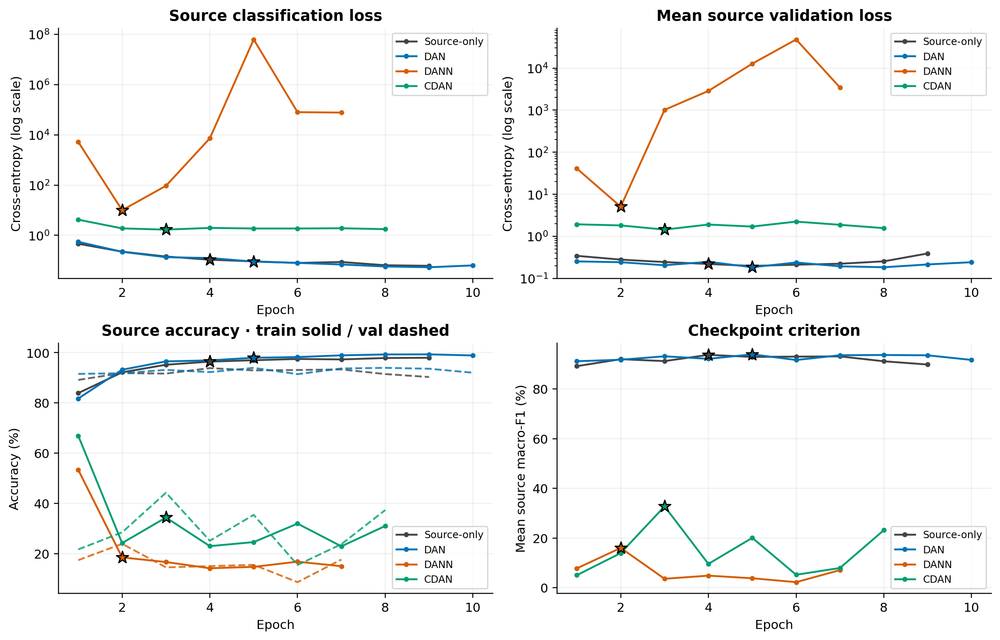

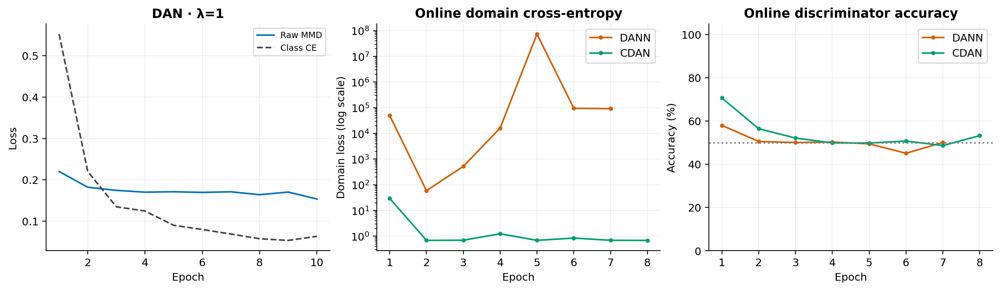

,epoch,train_loss,train_accuracy,mean_val_macro_f1,mean_val_accuracy,mean_val_loss,photo_accuracy,photo_macro_f1,photo_loss,art_painting_accuracy,art_painting_macro_f1,art_painting_loss,cartoon_accuracy,cartoon_macro_f1,cartoon_loss,method,family,classification_loss,mmd_loss,weighted_mmd_loss,domain_loss,domain_accuracy,mean_grl_strength,last_grl_strength
0,1,4.620000e-01,0.839,0.892,0.892,0.343,0.937,0.925,0.190,0.812,0.816,0.651,0.925,0.934,0.189,Source-only,original,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2.240000e-01,0.922,0.920,0.919,0.279,0.946,0.938,0.159,0.902,0.905,0.344,0.908,0.917,0.334,Source-only,original,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,1.440000e-01,0.952,0.912,0.917,0.244,0.955,0.945,0.117,0.883,0.877,0.373,0.913,0.915,0.242,Source-only,original,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,1.070000e-01,0.965,0.937,0.939,0.220,0.967,0.960,0.092,0.900,0.900,0.385,0.949,0.952,0.182,Source-only,original,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,9.200000e-02,0.970,0.929,0.930,0.197,0.967,0.961,0.104,0.888,0.886,0.324,0.934,0.940,0.163,Source-only,original,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,8.000000e-02,0.975,0.930,0.931,0.211,0.961,0.953,0.118,0.905,0.904,0.250,0.928,0.934,0.266,Source-only,original,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,8.700000e-02,0.973,0.931,0.933,0.222,0.946,0.939,0.167,0.910,0.907,0.255,0.945,0.947,0.245,Source-only,original,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,6.400000e-02,0.979,0.912,0.915,0.254,0.952,0.944,0.148,0.863,0.855,0.392,0.930,0.936,0.222,Source-only,original,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,6.100000e-02,0.980,0.898,0.903,0.391,0.958,0.949,0.158,0.820,0.809,0.727,0.932,0.938,0.288,Source-only,original,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,1,7.730000e-01,0.818,0.912,0.916,0.253,0.955,0.947,0.139,0.871,0.867,0.371,0.921,0.921,0.249,DAN,original,5.520000e-01,0.220,0.220,NaN,NaN,NaN,NaN


In [5]:
fig,axs=plt.subplots(2,2,figsize=(11,7),layout='constrained')
for m in MAIN:
    h=histories[m];best=h[h.epoch==completed[m]['best_epoch']].iloc[0]
    cls='classification_loss' if 'classification_loss' in h else 'train_loss'
    for ax,col,scale in [(axs[0,0],cls,1),(axs[0,1],'mean_val_loss',1),(axs[1,0],'train_accuracy',100),(axs[1,1],'mean_val_macro_f1',100)]:
        ax.plot(h.epoch,h[col]*scale,'o-',ms=3,label=m,color=COLORS[m])
        ax.scatter(best.epoch,best[col]*scale,s=100,marker='*',color=COLORS[m],edgecolor='black',zorder=5)
    axs[1,0].plot(h.epoch,100*h.mean_val_accuracy,'--',color=COLORS[m],alpha=.8)
for ax,title,ylabel in zip(axs.flat,['Source classification loss','Mean source validation loss','Source accuracy · train solid / val dashed','Checkpoint criterion'],
                         ['Cross-entropy (log scale)','Cross-entropy (log scale)','Accuracy (%)','Mean source macro-F1 (%)']):
    ax.set(title=title,xlabel='Epoch',ylabel=ylabel);ax.grid(alpha=.2);ax.legend(fontsize=8)
axs[0,0].set_yscale('log');axs[0,1].set_yscale('log')
figure(fig,'08_original_learning_curves','Saved original training and source validation curves, with selected epochs')
fig,axs=plt.subplots(1,3,figsize=(13,3.7),layout='constrained')
h=histories['DAN'];axs[0].plot(h.epoch,h.mmd_loss,label='Raw MMD',color=COLORS['DAN']);axs[0].plot(h.epoch,h.classification_loss,'--',label='Class CE',color='#444444')
axs[0].set(title='DAN · λ=1',ylabel='Loss',xlabel='Epoch');axs[0].legend(fontsize=8)
for m in ['DANN','CDAN']:
    h=histories[m];axs[1].plot(h.epoch,h.domain_loss,'o-',ms=3,label=m,color=COLORS[m])
    axs[2].plot(h.epoch,100*h.domain_accuracy,'o-',ms=3,label=m,color=COLORS[m])
axs[1].set(title='Online domain cross-entropy',ylabel='Domain loss (log scale)',xlabel='Epoch');axs[1].set_yscale('log');axs[1].legend()
axs[2].axhline(50,color='gray',ls=':');axs[2].set(title='Online discriminator accuracy',ylabel='Accuracy (%)',xlabel='Epoch',ylim=(0,105));axs[2].legend()
for ax in axs:ax.grid(alpha=.2)
figure(fig,'09_original_alignment_losses','MMD and adversarial learning diagnostics; chance accuracy does not establish success')
history_table=pd.concat([h.assign(method=m,family='original') for m,h in histories.items()],ignore_index=True)
table(history_table,'08_original_histories','Full original epoch measurements; rate columns are fractions')


## 6. Per-class transfer, confusions, and prediction concentration

Class changes below compare the same target images with Source-only. A model can improve one class while degrading overall performance. A row-normalized confusion matrix shows where each true class goes; a prediction-share table detects concentration in a few output classes. The true target class distribution is shown alongside it so imbalance is not mistaken for collapse.

,method,class_name,count,accuracy,dominant_confusion,dominant_confusion_count,accuracy_change_pp
0,Source-only,dog,772,0.341,elephant,356,0.000
1,Source-only,elephant,740,0.992,dog,3,0.000
2,Source-only,giraffe,753,0.720,horse,90,0.000
3,Source-only,guitar,608,0.854,elephant,79,0.000
4,Source-only,horse,816,0.647,elephant,214,0.000
5,Source-only,house,80,0.725,elephant,15,0.000
6,Source-only,person,160,0.456,elephant,49,0.000
7,DAN,dog,772,0.519,person,196,17.876
8,DAN,elephant,740,0.709,house,90,-28.243
9,DAN,giraffe,753,0.567,person,152,-15.272


,method,class_name,count,accuracy,dominant_confusion,dominant_confusion_count,accuracy_change_pp
0,Source-only,dog,772,0.341,elephant,356,0.0
6,Source-only,person,160,0.456,elephant,49,0.0
4,Source-only,horse,816,0.647,elephant,214,0.0
2,Source-only,giraffe,753,0.720,horse,90,0.0
5,Source-only,house,80,0.725,elephant,15,0.0
3,Source-only,guitar,608,0.854,elephant,79,0.0
1,Source-only,elephant,740,0.992,dog,3,0.0


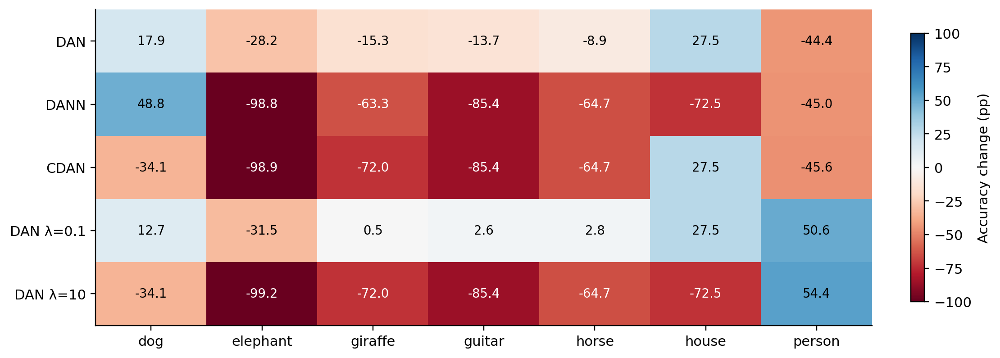

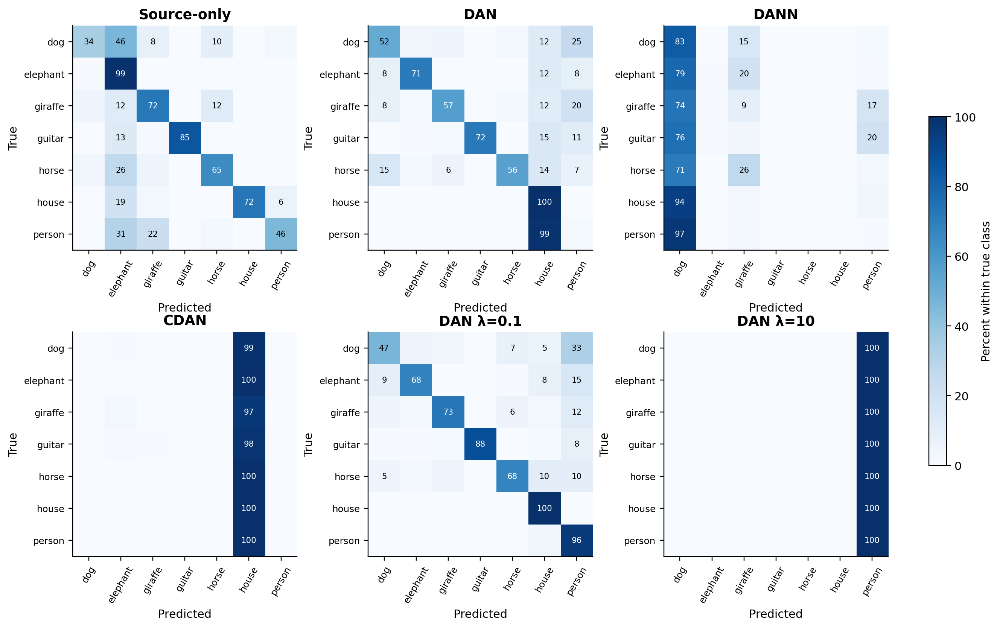

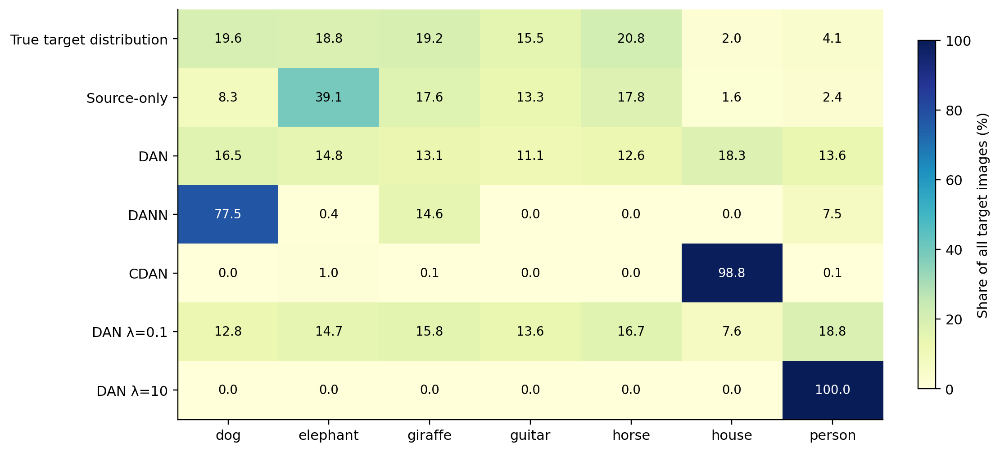

,method,predicted_classes,dominant_class,dominant_share_pct
0,Source-only,7,elephant,39.094
1,DAN,7,house,18.300
2,DANN,4,dog,77.475
3,CDAN,4,house,98.829
4,DAN λ=0.1,7,person,18.783
5,DAN λ=10,1,person,100.000


In [6]:
table(per_class,'10_original_per_class','Class accuracy, dominant confusion, and change from source-only')
base_classes=per_class[per_class.method=='Source-only'].sort_values('accuracy')
table(base_classes,'10_source_only_class_failures','Source-only target classes ordered by increasing accuracy')
def heatmap(data,name,purpose,label,cmap='RdBu',vmin=-100,vmax=100):
    fig,ax=plt.subplots(figsize=(10,max(2.5,.48*len(data)+1.1)),layout='constrained')
    im=ax.imshow(data.to_numpy(),cmap=cmap,vmin=vmin,vmax=vmax,aspect='auto')
    ax.set(xticks=range(len(data.columns)),xticklabels=data.columns,yticks=range(len(data)),yticklabels=data.index)
    for i in range(len(data)):
        for j in range(len(data.columns)):
            val=data.iloc[i,j];color='white' if (abs(val)>55 if vmin<0 else val>55) else 'black'
            ax.text(j,i,f'{val:.1f}',ha='center',va='center',color=color,fontsize=9)
    fig.colorbar(im,ax=ax,label=label,shrink=.85);figure(fig,name,purpose)
delta=per_class.pivot(index='method',columns='class_name',values='accuracy_change_pp').reindex(index=ALL[1:],columns=CLASSES)
heatmap(delta,'11_class_transfer','Original class-level accuracy changes from source-only','Accuracy change (pp)')
def confusion_panel(groups,name,purpose,ncols=3):
    nrows=int(np.ceil(len(groups)/ncols));fig,axs=plt.subplots(nrows,ncols,figsize=(4*ncols,3.7*nrows),layout='constrained',squeeze=False)
    for ax,(m,p) in zip(axs.flat,groups.items()):
        cm=confusion_matrix(p.label,p.predicted_label,labels=range(7));norm=100*cm/cm.sum(axis=1,keepdims=True)
        im=ax.imshow(norm,vmin=0,vmax=100,cmap='Blues')
        ax.set(title=m,xticks=range(7),xticklabels=CLASSES,yticks=range(7),yticklabels=CLASSES,xlabel='Predicted',ylabel='True')
        ax.tick_params(axis='x',rotation=60,labelsize=8);ax.tick_params(axis='y',labelsize=8)
        for i in range(7):
            for j in range(7):
                if norm[i,j]>=5:ax.text(j,i,f'{norm[i,j]:.0f}',ha='center',va='center',fontsize=7,color='white' if norm[i,j]>55 else 'black')
    for ax in list(axs.flat)[len(groups):]:ax.axis('off')
    fig.colorbar(im,ax=list(axs.flat),label='Percent within true class',shrink=.65)
    figure(fig,name,purpose)
confusion_panel({m:predictions[predictions.method==m] for m in ALL},'12_original_confusions','Row-normalized target confusions for all original runs')
shares=[]
shares.append(pd.Series(100*np.bincount(truth,minlength=7)/len(truth),index=CLASSES,name='True target distribution'))
diagnostics=[]
for m in ALL:
    p=predictions[predictions.method==m];counts=p.predicted_label.value_counts()
    shares.append(pd.Series(100*np.bincount(p.predicted_label,minlength=7)/len(p),index=CLASSES,name=m))
    diagnostics.append(dict(method=m,predicted_classes=len(counts),dominant_class=CLASSES[int(counts.idxmax())],dominant_share_pct=100*counts.max()/len(p)))
heatmap(pd.DataFrame(shares),'13_prediction_distribution','True class proportions and original predicted class shares','Share of all target images (%)',cmap='YlGnBu',vmin=0,vmax=100)
table(pd.DataFrame(diagnostics),'13_prediction_concentration','Target predicted-class count and dominant prediction share')


## 7. Controlled DAN alignment-strength study

Only the **original** λ=0.1,1,10 runs belong in this study. The code verifies equality of their saved configurations after removing `lambda_mmd`. The main DAN run supplies λ=1. The plot compares selected source performance, the final held-out domain probe, and final target recognition. These are different metrics, not interchangeable objectives.

Use mean source-validation macro-F1 to identify which tested setting could have been selected without target labels. This is a retrospective application of the stated rule, not proof that a separate selection decision was prospectively recorded. Recover your original hypothesis if available; do not write a new one as though it preceded the experiments. Recovery λ=10 changes multiple factors and cannot replace the original λ=10 row here.

,method,photo_accuracy,photo_macro_f1,art_painting_accuracy,art_painting_macro_f1,cartoon_accuracy,cartoon_macro_f1,mean_source_accuracy,mean_source_macro_f1,target_accuracy,target_macro_f1,domain_separability,probe_train_count,probe_test_count,target_accuracy_change_pp,lambda_mmd
0,DAN λ=0.1,0.970,0.966,0.937,0.938,0.959,0.964,0.955,0.956,0.694,0.653,0.927,1698,728,0.280,0.1
1,DAN,0.970,0.965,0.900,0.901,0.949,0.952,0.940,0.939,0.592,0.538,0.824,1698,728,-9.952,1.0
2,DAN λ=10,0.257,0.059,0.220,0.051,0.173,0.042,0.217,0.051,0.041,0.011,0.735,1698,728,-65.080,10.0


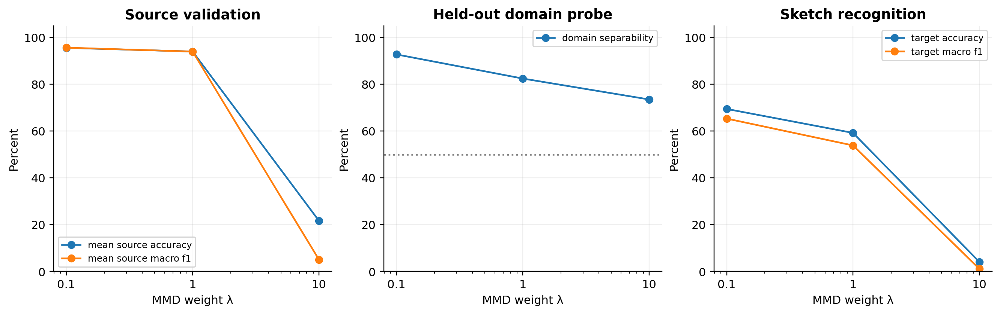

Applying the source-only selection criterion to these saved runs picks **λ=0.1**, with mean source macro-F1 **95.61%**. Target metrics were not used in this calculation.

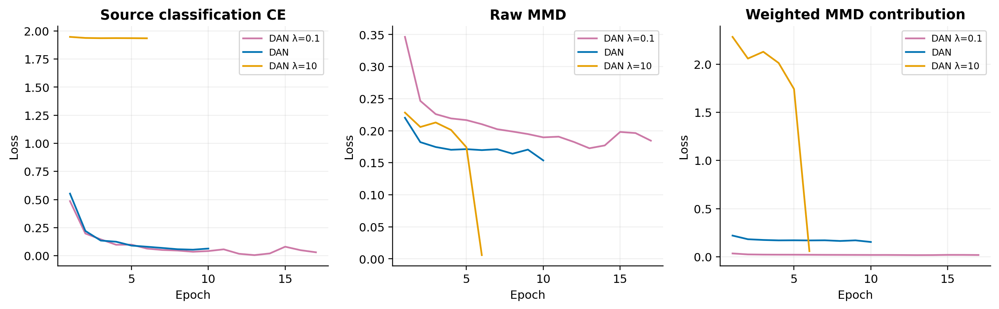

In [7]:
study_names=['DAN λ=0.1','DAN','DAN λ=10']
common=[{k:v for k,v in configs[m].items() if k!='lambda_mmd'} for m in study_names]
assert common[0]==common[1]==common[2]
study=comparison.set_index('method').loc[study_names].reset_index();study['lambda_mmd']=[.1,1.,10.]
table(study,'14_controlled_lambda_study','Original lambda-only comparison; all other saved recipe fields match')
fig,axs=plt.subplots(1,3,figsize=(12,3.7),layout='constrained')
for ax,cols,title in [(axs[0],['mean_source_accuracy','mean_source_macro_f1'],'Source validation'),
                     (axs[1],['domain_separability'],'Held-out domain probe'),
                     (axs[2],['target_accuracy','target_macro_f1'],'Sketch recognition')]:
    for col in cols:ax.plot(study.lambda_mmd,100*study[col],'o-',label=col.replace('_',' '))
    ax.set(xscale='log',xticks=[.1,1,10],xticklabels=['0.1','1','10'],xlabel='MMD weight λ',ylabel='Percent',ylim=(0,105),title=title)
    ax.grid(alpha=.2);ax.legend(fontsize=8)
axs[1].axhline(50,color='gray',ls=':')
figure(fig,'15_lambda_tradeoff','Source, probe and target behavior as original alignment pressure changes')
selected=study.loc[study.mean_source_macro_f1.idxmax()]
display(Markdown(f"Applying the source-only selection criterion to these saved runs picks **λ={selected.lambda_mmd:g}**, with mean source macro-F1 **{100*selected.mean_source_macro_f1:.2f}%**. Target metrics were not used in this calculation."))
fig,axs=plt.subplots(1,3,figsize=(12,3.6),layout='constrained')
for m in study_names:
    h=histories[m]
    for ax,col in zip(axs,['classification_loss','mmd_loss','weighted_mmd_loss']):ax.plot(h.epoch,h[col],label=m,color=COLORS[m])
for ax,title in zip(axs,['Source classification CE','Raw MMD','Weighted MMD contribution']):
    ax.set(title=title,xlabel='Epoch',ylabel='Loss');ax.legend(fontsize=8);ax.grid(alpha=.2)
figure(fig,'16_lambda_losses','Distinguish raw discrepancy from its weighted contribution')


## 8. Recovery v1: a separately labeled follow-up

Recovery was designed after original target-result inspection. It starts from the trained Source-only checkpoint, freezes BatchNorm affine parameters as well as statistics, uses lower learning rates, gradient clipping at norm 1, a five-epoch alignment ramp, maximum GRL 0.1, a 20-epoch maximum and patience 8, and begins checkpoint selection at epoch 5. DAN λ=10 also uses a 1e-6 backbone rate. These departures are material to the required original protocol and must be disclosed.

Recovery accuracy is reported both against the failed original method and against Source-only. An improvement over a failed method is not automatically a gain over Source-only. Macro-F1 below is recomputed from saved recovery predictions with all seven classes; no inference or model training is run.

**Missing diagnostic:** recovery did not save a held-out domain-separability probe. Its online discriminator accuracy is not a substitute. The notebook leaves that field missing instead of borrowing the original probe value or inventing one. Use the original experiments for the complete required four-method/probe comparison.

,method,setting,original,recovery
0,DANN,alignment_ramp_epochs,None,5
1,DANN,backbone_learning_rate,None,1e-05
2,DANN,batchnorm,frozen_pretrained_running_stats_trainable_affine,frozen_pretrained_running_stats_and_affine
3,DANN,discriminator_learning_rate,None,1e-05
4,DANN,epochs,30,20
5,DANN,experiment,None,recovery_v1
6,DANN,experiment_note,None,Follow-up after original target-result inspection
7,DANN,freeze_batchnorm_affine,None,True
8,DANN,gradient_clip_norm,None,1.0
9,DANN,initial_checkpoint,None,d:\LUMS GAMING\6. 2026 Fall\CS 6304\Programmin...


,method,mean_source_accuracy_pct,mean_source_macro_f1_pct,target_accuracy_pct,target_macro_f1_pct,change_vs_source_only_pp,change_vs_original_method_pp,domain_separability_pct,selected_epoch,epochs_run,predicted_classes,dominant_prediction,dominant_share_pct
0,DANN recovery,92.472,92.340,22.296,12.019,-46.857,4.250,NaN,13,20,6,horse,57.012
1,CDAN recovery,95.729,95.623,79.384,82.859,10.232,77.297,NaN,6,14,7,horse,25.859
2,DAN λ=10 recovery,88.588,88.340,65.106,61.762,-4.047,61.033,NaN,5,13,7,person,23.645


,domain,accuracy,macro_f1,loss,count,method
0,photo,0.967,0.961,0.494,334,DANN recovery
1,art_painting,0.890,0.886,1.829,410,DANN recovery
2,cartoon,0.917,0.923,2.190,469,DANN recovery
3,photo,0.973,0.969,0.148,334,CDAN recovery
4,art_painting,0.941,0.940,0.314,410,CDAN recovery
5,cartoon,0.957,0.960,0.263,469,CDAN recovery
6,photo,0.937,0.928,0.427,334,DAN λ=10 recovery
7,art_painting,0.812,0.812,0.751,410,DAN λ=10 recovery
8,cartoon,0.908,0.911,0.440,469,DAN λ=10 recovery


,method,class_name,count,accuracy_pct,change_vs_source_only_pp
0,DANN recovery,dog,772,4.404,-29.663
1,DANN recovery,elephant,740,0.000,-99.189
2,DANN recovery,giraffe,753,0.133,-71.846
3,DANN recovery,guitar,608,5.921,-79.441
4,DANN recovery,horse,816,80.760,16.054
5,DANN recovery,house,80,2.500,-70.000
6,DANN recovery,person,160,90.000,44.375
7,CDAN recovery,dog,772,72.798,38.731
8,CDAN recovery,elephant,740,87.027,-12.162
9,CDAN recovery,giraffe,753,48.473,-23.506


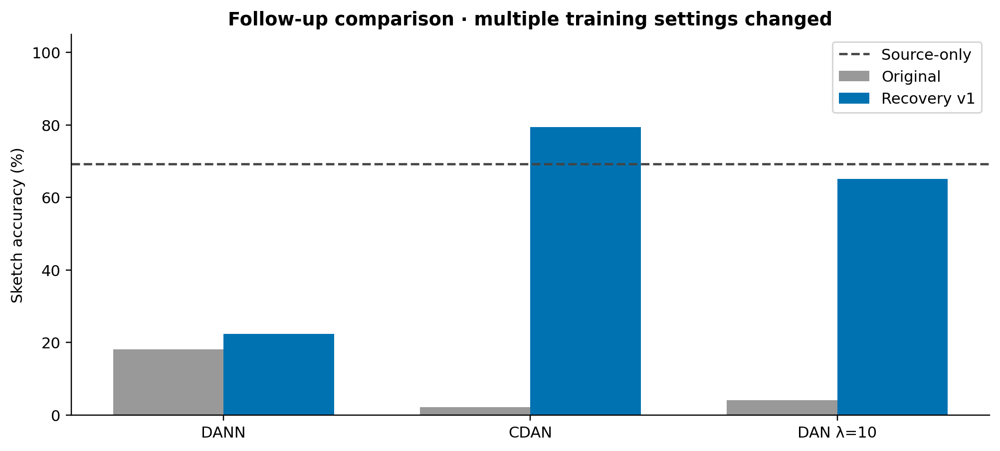

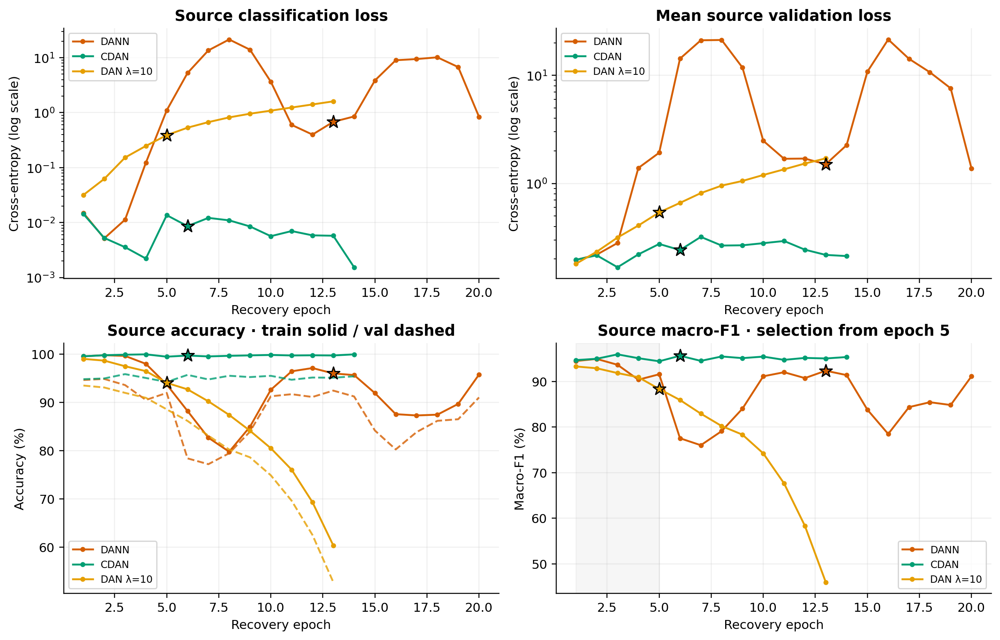

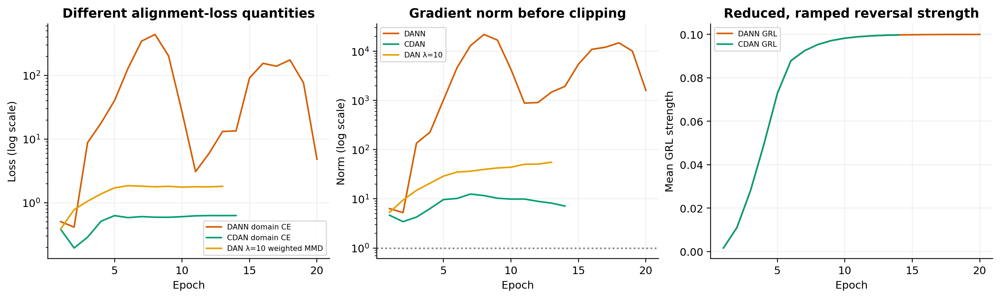

,epoch,train_loss,train_accuracy,mean_val_macro_f1,mean_val_accuracy,mean_val_loss,classification_loss,domain_loss,domain_accuracy,mean_grl_strength,last_grl_strength,mean_alignment_ramp,mean_gradient_norm_before_clip,photo_accuracy,photo_macro_f1,photo_loss,art_painting_accuracy,art_painting_macro_f1,art_painting_loss,cartoon_accuracy,cartoon_macro_f1,cartoon_loss,method,mmd_loss,weighted_mmd_loss
0,1,0.522,0.996,0.945,0.947,0.196,0.015,0.507,0.759,0.002,0.005,0.1,6.329,0.964,0.957,0.107,0.946,0.943,0.248,0.930,0.934,0.233,DANN recovery,NaN,NaN
1,2,0.420,0.998,0.949,0.949,0.219,0.005,0.415,0.809,0.011,0.018,0.3,5.247,0.973,0.969,0.131,0.927,0.928,0.222,0.947,0.951,0.305,DANN recovery,NaN,NaN
2,3,8.849,0.997,0.936,0.936,0.281,0.011,8.838,0.220,0.028,0.038,0.5,135.421,0.973,0.968,0.112,0.912,0.910,0.407,0.923,0.931,0.324,DANN recovery,NaN,NaN
3,4,18.037,0.980,0.904,0.905,1.390,0.123,17.914,0.386,0.049,0.061,0.7,226.902,0.955,0.948,0.629,0.878,0.875,1.726,0.883,0.888,1.816,DANN recovery,NaN,NaN
4,5,41.586,0.937,0.916,0.920,1.923,1.101,40.485,0.462,0.073,0.085,0.9,1026.478,0.955,0.950,1.319,0.888,0.881,2.021,0.917,0.916,2.431,DANN recovery,NaN,NaN
5,6,135.171,0.882,0.775,0.784,14.277,5.263,129.908,0.520,0.088,0.091,1.0,4611.430,0.880,0.857,4.518,0.739,0.734,15.404,0.733,0.735,22.908,DANN recovery,NaN,NaN
6,7,359.428,0.827,0.760,0.772,21.107,13.547,345.880,0.427,0.092,0.094,1.0,13018.388,0.871,0.852,9.280,0.710,0.703,21.649,0.736,0.726,32.392,DANN recovery,NaN,NaN
7,8,461.512,0.798,0.791,0.795,21.246,21.412,440.099,0.414,0.095,0.096,1.0,22025.356,0.880,0.864,8.630,0.756,0.756,19.178,0.748,0.753,35.931,DANN recovery,NaN,NaN
8,9,216.471,0.850,0.840,0.840,11.803,13.954,202.517,0.493,0.097,0.098,1.0,16900.509,0.919,0.904,3.527,0.802,0.805,12.345,0.797,0.811,19.535,DANN recovery,NaN,NaN
9,10,30.326,0.926,0.911,0.913,2.480,3.651,26.675,0.610,0.098,0.099,1.0,4305.632,0.952,0.945,1.126,0.880,0.883,2.824,0.906,0.906,3.490,DANN recovery,NaN,NaN


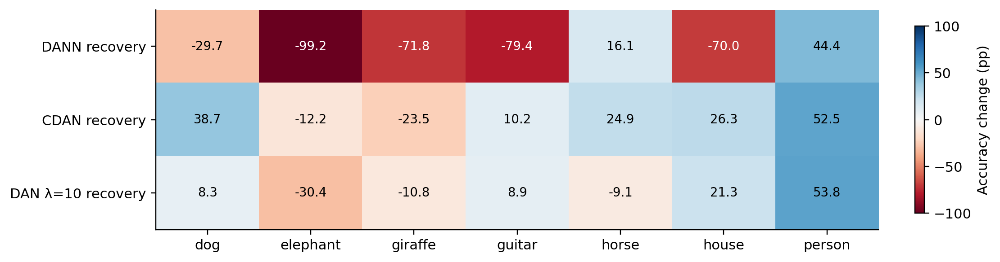

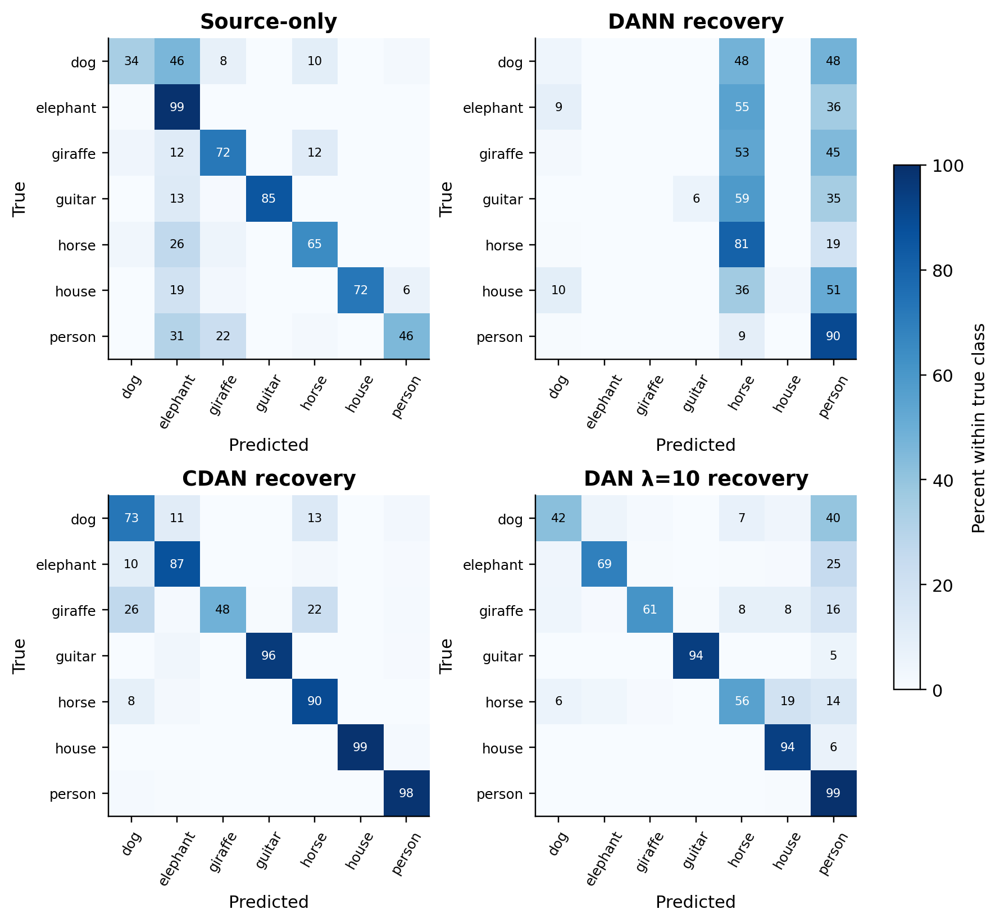

In [8]:
recipe_rows=[]
for m,run in REC.items():
    old={'dann':'DANN','cdan':'CDAN','dan_lambda_10':'DAN λ=10'}[run]
    for key in sorted(set(configs[old])|set(rec_config[m])):
        a=configs[old].get(key);b=rec_config[m].get(key)
        if a!=b:recipe_rows.append(dict(method=old,setting=key,original=str(a),recovery=str(b)))
table(pd.DataFrame(recipe_rows),'17_recovery_recipe_changes','Every saved configuration difference between original and follow-up')
rec_rows=[];rec_class_rows=[]
for m,run in REC.items():
    p=rec_pred[rec_pred.run==run];counts=p.predicted_label.value_counts();s=rec_source[m];old=rec_saved.set_index('run').loc[run]
    rec_rows.append(dict(method=m,mean_source_accuracy_pct=100*s.accuracy.mean(),mean_source_macro_f1_pct=100*s.macro_f1.mean(),
        target_accuracy_pct=100*accuracy_score(p.label,p.predicted_label),target_macro_f1_pct=100*f1_score(p.label,p.predicted_label,labels=range(7),average='macro'),
        change_vs_source_only_pp=100*(p.correct.mean()-base.target_accuracy),change_vs_original_method_pp=old.change_pp,
        domain_separability_pct=np.nan,selected_epoch=rec_done[m]['best_epoch'],epochs_run=rec_done[m]['completed_epochs'],
        predicted_classes=len(counts),dominant_prediction=CLASSES[int(counts.idxmax())],dominant_share_pct=100*counts.max()/len(p)))
    for label,cls in enumerate(CLASSES):
        q=p[p.label==label];acc=accuracy_score(q.label,q.predicted_label)
        base_acc=per_class[(per_class.method=='Source-only')&(per_class.class_name==cls)].iloc[0].accuracy
        rec_class_rows.append(dict(method=m,class_name=cls,count=len(q),accuracy_pct=100*acc,change_vs_source_only_pp=100*(acc-base_acc)))
rec_summary=pd.DataFrame(rec_rows);rec_classes=pd.DataFrame(rec_class_rows)
table(rec_summary,'18_recovery_comparison','Recovery target metrics derived from saved predictions; probe intentionally missing')
table(pd.concat([s.assign(method=m) for m,s in rec_source.items()],ignore_index=True),'18_recovery_source_domains','Per-source recovery validation measurements')
table(rec_classes,'18_recovery_per_class','Recovery class changes relative to the unchanged source-only baseline')
fig,ax=plt.subplots(figsize=(9,4),layout='constrained')
labels=['DANN','CDAN','DAN λ=10'];x=np.arange(3)
original=comparison.set_index('method').loc[labels].target_accuracy.to_numpy()*100
ax.bar(x-.18,original,.36,label='Original',color='#999999');ax.bar(x+.18,rec_summary.target_accuracy_pct,.36,label='Recovery v1',color='#0072B2')
ax.axhline(100*base.target_accuracy,color='#444444',ls='--',label='Source-only')
ax.set(xticks=x,xticklabels=labels,ylabel='Sketch accuracy (%)',ylim=(0,105),title='Follow-up comparison · multiple training settings changed')
ax.legend();figure(fig,'19_recovery_vs_original','Follow-up gains versus original methods and source-only')
fig,axs=plt.subplots(2,2,figsize=(11,7),layout='constrained')
for m,c in zip(REC,['#D55E00','#009E73','#E69F00']):
    h=rec_hist[m];selected=h[h.epoch==rec_done[m]['best_epoch']].iloc[0]
    for ax,col,scale in [(axs[0,0],'classification_loss',1),(axs[0,1],'mean_val_loss',1),
                         (axs[1,0],'train_accuracy',100),(axs[1,1],'mean_val_macro_f1',100)]:
        ax.plot(h.epoch,h[col]*scale,'o-',ms=3,label=m.replace(' recovery',''),color=c)
        ax.scatter(selected.epoch,selected[col]*scale,marker='*',s=110,color=c,edgecolor='black',zorder=5)
    axs[1,0].plot(h.epoch,100*h.mean_val_accuracy,'--',color=c,alpha=.8)
for ax,title,ylabel in zip(axs.flat,['Source classification loss','Mean source validation loss','Source accuracy · train solid / val dashed','Source macro-F1 · selection from epoch 5'],
                         ['Cross-entropy (log scale)','Cross-entropy (log scale)','Accuracy (%)','Macro-F1 (%)']):
    ax.set(title=title,xlabel='Recovery epoch',ylabel=ylabel);ax.legend(fontsize=8);ax.grid(alpha=.2)
axs[0,0].set_yscale('log');axs[0,1].set_yscale('log');axs[1,1].axvspan(1,5,alpha=.07,color='gray')
figure(fig,'20_recovery_learning_curves','Actual follow-up source curves; stars mark eligible selected checkpoints')
fig,axs=plt.subplots(1,3,figsize=(13,3.8),layout='constrained')
for m,c in zip(REC,['#D55E00','#009E73','#E69F00']):
    h=rec_hist[m];col='domain_loss' if 'domain_loss' in h else 'weighted_mmd_loss'
    axs[0].plot(h.epoch,h[col],label=m.replace(' recovery','')+(' domain CE' if col=='domain_loss' else ' weighted MMD'),color=c)
    axs[1].plot(h.epoch,h.mean_gradient_norm_before_clip,label=m.replace(' recovery',''),color=c)
    if 'mean_grl_strength' in h:axs[2].plot(h.epoch,h.mean_grl_strength,label=m.replace(' recovery','')+' GRL',color=c)
axs[0].set(title='Different alignment-loss quantities',xlabel='Epoch',ylabel='Loss (log scale)');axs[0].set_yscale('log')
axs[1].set(title='Gradient norm before clipping',xlabel='Epoch',ylabel='Norm (log scale)');axs[1].set_yscale('log');axs[1].axhline(1,color='gray',ls=':')
axs[2].set(title='Reduced, ramped reversal strength',xlabel='Epoch',ylabel='Mean GRL strength')
for ax in axs:ax.legend(fontsize=7);ax.grid(alpha=.2)
figure(fig,'21_recovery_diagnostics','Recovery alignment objectives, gradient norms and reversal schedule')
table(pd.concat([h.assign(method=m) for m,h in rec_hist.items()],ignore_index=True),'20_recovery_histories','Full recovery epoch measurements')
heatmap(rec_classes.pivot(index='method',columns='class_name',values='change_vs_source_only_pp').reindex(index=list(REC),columns=CLASSES),
        '22_recovery_class_changes','Follow-up class changes relative to source-only','Accuracy change (pp)')
confusion_panel({'Source-only':base_pred,**{m:rec_pred[rec_pred.run==run] for m,run in REC.items()}},
                '23_recovery_confusions','Baseline and follow-up row-normalized target confusion matrices',ncols=2)


## 9. Real improvements and introduced errors

Each column below is a true Sketch image from saved predictions. Examples are chosen deterministically by path from two groups: an adaptation method corrects a Source-only error, or it introduces an error on an image Source-only classified correctly. The first two rows use original methods; the last row uses explicitly labeled recovery CDAN. This is deliberate failure-case selection after evaluation, not a representative estimate and not a basis for retuning.

Predictions are categorical because confidence/logits were not present in these exported target-prediction CSVs. No confidence is invented.

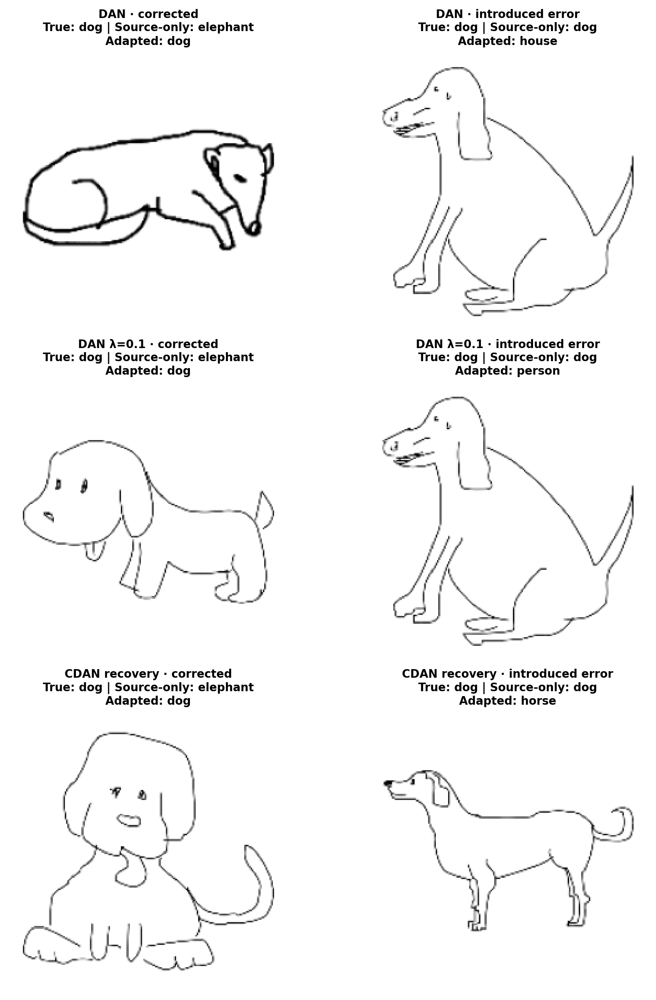

,method,case_type,path,true_class,baseline_prediction,adapted_prediction
0,DAN,corrected,sketch/dog/n02103406_1011-2.png,dog,elephant,dog
1,DAN,introduced error,sketch/dog/5288.png,dog,dog,house
2,DAN λ=0.1,corrected,sketch/dog/5299.png,dog,elephant,dog
3,DAN λ=0.1,introduced error,sketch/dog/5288.png,dog,dog,person
4,CDAN recovery,corrected,sketch/dog/5284.png,dog,elephant,dog
5,CDAN recovery,introduced error,sketch/dog/5332.png,dog,dog,horse


In [9]:
case_specs=[('DAN',predictions[predictions.method=='DAN']),('DAN λ=0.1',predictions[predictions.method=='DAN λ=0.1']),
            ('CDAN recovery',rec_pred[rec_pred.run=='cdan'])]
fig,axs=plt.subplots(3,2,figsize=(8,11),layout='constrained');cases=[]
for i,(m,p) in enumerate(case_specs):
    merged=p[['path','label','predicted_label']].merge(base_pred[['path','predicted_label']],on='path',suffixes=('','_base'),validate='one_to_one')
    for j,kind in enumerate(['corrected','introduced error']):
        condition=((merged.predicted_label==merged.label)&(merged.predicted_label_base!=merged.label)) if j==0 else ((merged.predicted_label!=merged.label)&(merged.predicted_label_base==merged.label))
        candidates=merged[condition].sort_values('path')
        if candidates.empty:axs[i,j].axis('off');axs[i,j].text(.5,.5,'No cases in this category',ha='center');continue
        v=candidates.iloc[0];im=transforms.CenterCrop(224)(transforms.Resize((256,256))(load_rgb(v.path)))
        title=f'{m} · {kind}\nTrue: {CLASSES[int(v.label)]} | Source-only: {CLASSES[int(v.predicted_label_base)]}\nAdapted: {CLASSES[int(v.predicted_label)]}'
        show(axs[i,j],im,title)
        cases.append(dict(method=m,case_type=kind,path=v.path,true_class=CLASSES[int(v.label)],baseline_prediction=CLASSES[int(v.predicted_label_base)],adapted_prediction=CLASSES[int(v.predicted_label)]))
figure(fig,'24_transfer_examples','Paired baseline/adaptation outcomes on actual target examples')
table(pd.DataFrame(cases),'24_transfer_case_paths','Exact paths and predictions for illustrated transfer cases')


## 10. Each original model, separately

The following dossiers keep each method's metrics and optimization history together. Mechanisms below are study prompts, not established causal explanations or text to paste into the report. Use the measurements, source-domain breakdowns, and selected failures to form your own interpretation.

### Source-only

**Mechanisms to examine:** This is the transfer reference and Task 3's shared ERM checkpoint. Source performance cannot reveal which Sketch cues generalize. Identify its weakest Sketch classes and dominant confusions before attributing the gap to loss of color, texture, or domain style. Task 1 offers qualitative context, but it uses different data, architecture and training.

In [10]:
m=ALL[0]
table(compact[compact.method==m], '25_model_1_overall', 'Separate overview for '+m)
table(source_metrics[m], '25_model_1_source', 'Separate source-domain metrics for '+m)
table(per_class[per_class.method==m], '25_model_1_classes', 'Separate target class results for '+m)
display(Markdown(f"Selected checkpoint: epoch **{completed[m]['best_epoch']}** out of **{completed[m]['completed_epochs']}** completed epochs, using mean source macro-F1."))


,method,mean_source_accuracy_pct,mean_source_macro_f1_pct,target_accuracy_pct,target_macro_f1_pct,target_accuracy_change_pp,domain_separability_pct
0,Source-only,93.863,93.741,69.152,69.725,0.0,99.863


,domain,accuracy,macro_f1,loss,count
0,photo,0.967,0.960,0.092,334
1,art_painting,0.900,0.900,0.385,410
2,cartoon,0.949,0.952,0.182,469


,method,class_name,count,accuracy,dominant_confusion,dominant_confusion_count,accuracy_change_pp
0,Source-only,dog,772,0.341,elephant,356,0.0
1,Source-only,elephant,740,0.992,dog,3,0.0
2,Source-only,giraffe,753,0.720,horse,90,0.0
3,Source-only,guitar,608,0.854,elephant,79,0.0
4,Source-only,horse,816,0.647,elephant,214,0.0
5,Source-only,house,80,0.725,elephant,15,0.0
6,Source-only,person,160,0.456,elephant,49,0.0


Selected checkpoint: epoch **4** out of **9** completed epochs, using mean source macro-F1.

### DAN

**Mechanisms to examine:** MMD matches pooled feature distributions without knowing target classes. Reduced domain separability can coexist with class mixing or unequal class priors. Compare the per-class gains and losses with source performance; do not infer that a smaller discrepancy guarantees a semantic match. The raw MMD, weighted term and independent probe are three different measurements.

In [11]:
m=ALL[1]
table(compact[compact.method==m], '25_model_2_overall', 'Separate overview for '+m)
table(source_metrics[m], '25_model_2_source', 'Separate source-domain metrics for '+m)
table(per_class[per_class.method==m], '25_model_2_classes', 'Separate target class results for '+m)
display(Markdown(f"Selected checkpoint: epoch **{completed[m]['best_epoch']}** out of **{completed[m]['completed_epochs']}** completed epochs, using mean source macro-F1."))


,method,mean_source_accuracy_pct,mean_source_macro_f1_pct,target_accuracy_pct,target_macro_f1_pct,target_accuracy_change_pp,domain_separability_pct
1,DAN,93.963,93.94,59.201,53.842,-9.952,82.418


,domain,accuracy,macro_f1,loss,count
0,photo,0.970,0.965,0.115,334
1,art_painting,0.900,0.901,0.279,410
2,cartoon,0.949,0.952,0.157,469


,method,class_name,count,accuracy,dominant_confusion,dominant_confusion_count,accuracy_change_pp
7,DAN,dog,772,0.519,person,196,17.876
8,DAN,elephant,740,0.709,house,90,-28.243
9,DAN,giraffe,753,0.567,person,152,-15.272
10,DAN,guitar,608,0.717,house,90,-13.651
11,DAN,horse,816,0.558,dog,125,-8.946
12,DAN,house,80,1.000,NaN,0,27.500
13,DAN,person,160,0.012,house,158,-44.375


Selected checkpoint: epoch **5** out of **10** completed epochs, using mean source macro-F1.

### DANN

**Mechanisms to examine:** The adversary and feature extractor optimize competing objectives. Examine the large early losses, selected checkpoint, and source macro-F1 before interpreting near-chance online domain accuracy as useful invariance. A weak or unstable discriminator can also score near chance. Compare it with the independent held-out probe and target prediction concentration.

In [12]:
m=ALL[2]
table(compact[compact.method==m], '25_model_3_overall', 'Separate overview for '+m)
table(source_metrics[m], '25_model_3_source', 'Separate source-domain metrics for '+m)
table(per_class[per_class.method==m], '25_model_3_classes', 'Separate target class results for '+m)
display(Markdown(f"Selected checkpoint: epoch **{completed[m]['best_epoch']}** out of **{completed[m]['completed_epochs']}** completed epochs, using mean source macro-F1."))


,method,mean_source_accuracy_pct,mean_source_macro_f1_pct,target_accuracy_pct,target_macro_f1_pct,target_accuracy_change_pp,domain_separability_pct
2,DANN,23.888,16.035,18.045,6.368,-51.107,99.863


,domain,accuracy,macro_f1,loss,count
0,photo,0.296,0.164,5.029,334
1,art_painting,0.222,0.141,4.840,410
2,cartoon,0.198,0.176,5.320,469


,method,class_name,count,accuracy,dominant_confusion,dominant_confusion_count,accuracy_change_pp
14,DANN,dog,772,0.829,giraffe,119,48.834
15,DANN,elephant,740,0.004,dog,582,-98.784
16,DANN,giraffe,753,0.086,dog,554,-63.347
17,DANN,guitar,608,0.000,dog,460,-85.362
18,DANN,horse,816,0.000,dog,578,-64.706
19,DANN,house,80,0.000,dog,75,-72.500
20,DANN,person,160,0.006,dog,155,-45.000


Selected checkpoint: epoch **2** out of **7** completed epochs, using mean source macro-F1.

### CDAN

**Mechanisms to examine:** The feature–probability product gives the adversary soft class structure, but inaccurate probabilities and unstable optimization may propagate misleading gradients. Class conditioning is a mechanism, not a guarantee. Compare the original CDAN with DAN/DANN at the same recipe, and treat recovery CDAN separately because its initialization and optimization differ.

In [13]:
m=ALL[3]
table(compact[compact.method==m], '25_model_4_overall', 'Separate overview for '+m)
table(source_metrics[m], '25_model_4_source', 'Separate source-domain metrics for '+m)
table(per_class[per_class.method==m], '25_model_4_classes', 'Separate target class results for '+m)
display(Markdown(f"Selected checkpoint: epoch **{completed[m]['best_epoch']}** out of **{completed[m]['completed_epochs']}** completed epochs, using mean source macro-F1."))


,method,mean_source_accuracy_pct,mean_source_macro_f1_pct,target_accuracy_pct,target_macro_f1_pct,target_accuracy_change_pp,domain_separability_pct
3,CDAN,44.238,32.756,2.087,0.65,-67.065,99.176


,domain,accuracy,macro_f1,loss,count
0,photo,0.530,0.352,1.220,334
1,art_painting,0.405,0.317,1.612,410
2,cartoon,0.392,0.313,1.496,469


,method,class_name,count,accuracy,dominant_confusion,dominant_confusion_count,accuracy_change_pp
21,CDAN,dog,772,0.000,house,765,-34.067
22,CDAN,elephant,740,0.003,house,738,-98.919
23,CDAN,giraffe,753,0.000,house,729,-71.979
24,CDAN,guitar,608,0.000,house,598,-85.362
25,CDAN,horse,816,0.000,house,813,-64.706
26,CDAN,house,80,1.000,NaN,0,27.500
27,CDAN,person,160,0.000,house,160,-45.625


Selected checkpoint: epoch **3** out of **8** completed epochs, using mean source macro-F1.

### DAN λ=0.1

**Mechanisms to examine:** A weaker penalty may retain more source-discriminative structure at the cost of residual domain information. Use the lambda-only table to assess that trade-off. A small aggregate change may hide opposing class changes or noise from a single run; it is not evidence of statistically significant superiority.

In [14]:
m=ALL[4]
table(compact[compact.method==m], '25_model_5_overall', 'Separate overview for '+m)
table(source_metrics[m], '25_model_5_source', 'Separate source-domain metrics for '+m)
table(per_class[per_class.method==m], '25_model_5_classes', 'Separate target class results for '+m)
display(Markdown(f"Selected checkpoint: epoch **{completed[m]['best_epoch']}** out of **{completed[m]['completed_epochs']}** completed epochs, using mean source macro-F1."))


,method,mean_source_accuracy_pct,mean_source_macro_f1_pct,target_accuracy_pct,target_macro_f1_pct,target_accuracy_change_pp,domain_separability_pct
4,DAN λ=0.1,95.538,95.613,69.432,65.307,0.28,92.72


,domain,accuracy,macro_f1,loss,count
0,photo,0.970,0.966,0.094,334
1,art_painting,0.937,0.938,0.224,410
2,cartoon,0.959,0.964,0.146,469


,method,class_name,count,accuracy,dominant_confusion,dominant_confusion_count,accuracy_change_pp
28,DAN λ=0.1,dog,772,0.468,person,252,12.694
29,DAN λ=0.1,elephant,740,0.677,person,114,-31.486
30,DAN λ=0.1,giraffe,753,0.725,person,89,0.531
31,DAN λ=0.1,guitar,608,0.880,person,49,2.632
32,DAN λ=0.1,horse,816,0.675,house,85,2.819
33,DAN λ=0.1,house,80,1.000,NaN,0,27.500
34,DAN λ=0.1,person,160,0.962,house,6,50.625


Selected checkpoint: epoch **12** out of **17** completed epochs, using mean source macro-F1.

### DAN λ=10

**Mechanisms to examine:** A large weighted discrepancy can dominate useful class gradients. Check source macro-F1, predicted-class count and target confusion rather than equating reduced separability with successful adaptation. Recovery λ=10 changes initialization, learning rate and stabilization; it cannot isolate the effect of lambda.

In [15]:
m=ALL[5]
table(compact[compact.method==m], '25_model_6_overall', 'Separate overview for '+m)
table(source_metrics[m], '25_model_6_source', 'Separate source-domain metrics for '+m)
table(per_class[per_class.method==m], '25_model_6_classes', 'Separate target class results for '+m)
display(Markdown(f"Selected checkpoint: epoch **{completed[m]['best_epoch']}** out of **{completed[m]['completed_epochs']}** completed epochs, using mean source macro-F1."))


,method,mean_source_accuracy_pct,mean_source_macro_f1_pct,target_accuracy_pct,target_macro_f1_pct,target_accuracy_change_pp,domain_separability_pct
5,DAN λ=10,21.657,5.067,4.072,1.118,-65.08,73.489


,domain,accuracy,macro_f1,loss,count
0,photo,0.257,0.059,1.932,334
1,art_painting,0.220,0.051,1.937,410
2,cartoon,0.173,0.042,1.936,469


,method,class_name,count,accuracy,dominant_confusion,dominant_confusion_count,accuracy_change_pp
35,DAN λ=10,dog,772,0.0,person,772,-34.067
36,DAN λ=10,elephant,740,0.0,person,740,-99.189
37,DAN λ=10,giraffe,753,0.0,person,753,-71.979
38,DAN λ=10,guitar,608,0.0,person,608,-85.362
39,DAN λ=10,horse,816,0.0,person,816,-64.706
40,DAN λ=10,house,80,0.0,person,80,-72.500
41,DAN λ=10,person,160,1.0,NaN,0,54.375


Selected checkpoint: epoch **1** out of **6** completed epochs, using mean source macro-F1.

### Recovery methods, separately

These rows add follow-up evidence without merging experiment families. Recovery source performance alone does not establish target success. Contrast each row's changes against Source-only with its larger change against the original failed method.

In [16]:
for i,m in enumerate(REC,1):
    display(Markdown('#### '+m+' · follow-up'))
    table(rec_summary[rec_summary.method==m],f'26_recovery_{i}_overall','Separate recovery overview')
    table(rec_source[m],f'26_recovery_{i}_source','Separate recovery source domains')
    table(rec_classes[rec_classes.method==m],f'26_recovery_{i}_classes','Separate recovery target class results')


#### DANN recovery · follow-up

,method,mean_source_accuracy_pct,mean_source_macro_f1_pct,target_accuracy_pct,target_macro_f1_pct,change_vs_source_only_pp,change_vs_original_method_pp,domain_separability_pct,selected_epoch,epochs_run,predicted_classes,dominant_prediction,dominant_share_pct
0,DANN recovery,92.472,92.34,22.296,12.019,-46.857,4.25,NaN,13,20,6,horse,57.012


,domain,accuracy,macro_f1,loss,count
0,photo,0.967,0.961,0.494,334
1,art_painting,0.890,0.886,1.829,410
2,cartoon,0.917,0.923,2.190,469


,method,class_name,count,accuracy_pct,change_vs_source_only_pp
0,DANN recovery,dog,772,4.404,-29.663
1,DANN recovery,elephant,740,0.000,-99.189
2,DANN recovery,giraffe,753,0.133,-71.846
3,DANN recovery,guitar,608,5.921,-79.441
4,DANN recovery,horse,816,80.760,16.054
5,DANN recovery,house,80,2.500,-70.000
6,DANN recovery,person,160,90.000,44.375


#### CDAN recovery · follow-up

,method,mean_source_accuracy_pct,mean_source_macro_f1_pct,target_accuracy_pct,target_macro_f1_pct,change_vs_source_only_pp,change_vs_original_method_pp,domain_separability_pct,selected_epoch,epochs_run,predicted_classes,dominant_prediction,dominant_share_pct
1,CDAN recovery,95.729,95.623,79.384,82.859,10.232,77.297,NaN,6,14,7,horse,25.859


,domain,accuracy,macro_f1,loss,count
0,photo,0.973,0.969,0.148,334
1,art_painting,0.941,0.940,0.314,410
2,cartoon,0.957,0.960,0.263,469


,method,class_name,count,accuracy_pct,change_vs_source_only_pp
7,CDAN recovery,dog,772,72.798,38.731
8,CDAN recovery,elephant,740,87.027,-12.162
9,CDAN recovery,giraffe,753,48.473,-23.506
10,CDAN recovery,guitar,608,95.559,10.197
11,CDAN recovery,horse,816,89.583,24.877
12,CDAN recovery,house,80,98.750,26.250
13,CDAN recovery,person,160,98.125,52.500


#### DAN λ=10 recovery · follow-up

,method,mean_source_accuracy_pct,mean_source_macro_f1_pct,target_accuracy_pct,target_macro_f1_pct,change_vs_source_only_pp,change_vs_original_method_pp,domain_separability_pct,selected_epoch,epochs_run,predicted_classes,dominant_prediction,dominant_share_pct
2,DAN λ=10 recovery,88.588,88.34,65.106,61.762,-4.047,61.033,NaN,5,13,7,person,23.645


,domain,accuracy,macro_f1,loss,count
0,photo,0.937,0.928,0.427,334
1,art_painting,0.812,0.812,0.751,410
2,cartoon,0.908,0.911,0.440,469


,method,class_name,count,accuracy_pct,change_vs_source_only_pp
14,DAN λ=10 recovery,dog,772,42.358,8.290
15,DAN λ=10 recovery,elephant,740,68.784,-30.405
16,DAN λ=10 recovery,giraffe,753,61.222,-10.757
17,DAN λ=10 recovery,guitar,608,94.243,8.882
18,DAN λ=10 recovery,horse,816,55.637,-9.069
19,DAN λ=10 recovery,house,80,93.750,21.250
20,DAN λ=10 recovery,person,160,99.375,53.750


## 11. Research-question worksheet (manual p. 8)

| Question | Evidence to consult | Write your own answer around these checks |
|---|---|---|
| RQ1 · How large is the Source-only domain gap, and which classes matter most? | Tables 05/06/10, Figures 03/07/12 | Quantify source/target gap; name weak classes, sample counts and dominant confusions. Distinguish overall accuracy from macro-F1. |
| RQ2 · Does less domain separability accompany better recognition? | Figures 07/09/11/13; table 05 | Compare the held-out probe with target accuracy and class changes. Separate semantic alignment from low domain-discriminator accuracy and prediction collapse. |
| RQ3 · Does class conditioning help versus marginal alignment? | Original DAN/DANN/CDAN dossiers, Figures 08–12 | Compare controlled original methods. Does the optimization evidence support a stable test of the mechanism? What can the distinct recovery results add, and what can they not isolate? |
| RQ4 · What changes with alignment strength, and what could be selected without target labels? | Tables 14 and Figures 15–16 | Use only original λ=0.1,1,10. Compare source/probe/target trade-offs and the source-only selection calculation. Recover the prospective hypothesis; label new reasoning retrospective. |

Your notes: for each answer, record **observation → numeric/table evidence → concrete example → proposed mechanism → limitation**. Do not infer a universal ranking of algorithms from one unstable run or one random seed.

## 12. Task 5: connecting this task to the full study

| Synthesis theme | Task 2 evidence | Evidence needed elsewhere |
|---|---|---|
| Visual cues and distribution shift | PACS domain examples, source gap, class confusions and transfer cases | Task 1 color/texture/spatial sensitivity. Connect qualitatively; datasets, architectures and training differ. |
| Invariance versus discriminability | Independent domain probe, class/source performance, lambda study | Task 3 source-domain separability and unseen-target recognition. Lower domain information alone is insufficient. |
| Importance of target access | Source-only baseline and original target-aware DAN | Task 3's identical ERM checkpoint and target-free DAN-DG. Target access is not the only difference between methods; recovery after target inspection adds another limitation. |
| Recognition versus rejection | Closed-set models still choose one of seven known labels | Task 4 unknown rejection and CSA. PACS Sketch has the same class set; a domain-shift failure is not itself an unknown-class detection experiment. |
| Overall synthesis | Cases where alignment preserves or damages class evidence | Combine all four tasks to discuss nuisance invariance, discriminability, and when to abstain. |

## 13. Main-report evidence and limitations checklist

- Include the complete original comparison: every source validation domain, source means, target accuracy/macro-F1/change, and held-out domain separability.
- Include classification and alignment/domain-loss curves; do not hide unstable early epochs or replace the online domain metric with the final probe.
- Include per-class changes and concrete corrected/introduced-error cases, plus the original lambda study.
- Label recovery clearly as a changed-recipe follow-up after original target inspection. Its BatchNorm affine policy and initialization differ from the required original recipe.
- Recovery probe results are absent; do not reuse the original probe numbers. Target macro-F1 here is newly calculated only from already saved predictions.
- Check checkpoint-selection timing: original best source macro-F1 versus recovery's eligibility starting at epoch 5. No target-per-epoch curve exists.
- Single seed and unequal class frequencies limit claims; small aggregate differences are not significance tests. Post-hoc mechanism explanations do not establish causality.
- For the full 8-page NeurIPS-format report, prioritize required evidence in the main text; optional appendix material cannot replace it. References are outside the page limit. Put the public GitHub link at the end of the abstract.
- Preserve configurations, split IDs, environment information and reproducible result tables; attribute reused code. Keep raw datasets and unnecessary large checkpoints out of Git. Report prose and interpretation must be your own.

**Source map:** assignment pp. 5–8 and 16–17; `shared/pacs.ipynb`, `shared/pacs_protocol.ipynb`, `task2/methods/`, `task2/evaluation/domain_separability.ipynb`, current configs, and saved original/recovery artifacts. `source_manifest.csv` records the specific files consumed by this notebook.

In [17]:
# Verify immutable selected checkpoints against saved evaluation records; do not load models or infer images.
lock=read_json(RESULTS/'final_evaluation/evaluation_lock.json')
rec_lock=read_json(RESULTS/'recovery_v1/final_evaluation/evaluation_lock.json')
checks=[]
for m,run in RUNS.items():
    path=RESULTS/run/'best.pt';sources.add(path)
    original_name=next((k for k,v in ALIASES.items() if v==m),m)
    assert sha(path)==lock['runs'][original_name]['checkpoint_sha256']
    checks.append(dict(family='original',method=m,checkpoint_hash_matches=True))
for m,run in REC.items():
    path=RESULTS/'recovery_v1'/run/'best.pt';sources.add(path)
    assert sha(path)==rec_lock['runs'][run]['checkpoint_sha256']
    checks.append(dict(family='recovery',method=m,checkpoint_hash_matches=True))
table(pd.DataFrame(checks),'27_checkpoint_integrity','Saved selected checkpoints match experiment evaluation locks')
for p in [PA1/'ATML_PA1.pdf',TASK.parent/'shared/pacs.ipynb',TASK.parent/'shared/pacs_protocol.ipynb',
          TASK/'evaluation/domain_separability.ipynb',TASK/'train.ipynb',TASK.parent/'shared/recovery_support.py']:
    sources.add(p)
sources.update((TASK/'methods').glob('*.ipynb'))
manifest=[dict(source=str(p.relative_to(PA1)),bytes=p.stat().st_size,sha256=sha(p)) for p in sorted(sources)]
pd.DataFrame(manifest).to_csv(OUT/'source_manifest.csv',index=False)
pd.DataFrame(assets).drop_duplicates('file').to_csv(OUT/'asset_index.csv',index=False)
print('Completed report evidence export:',len(set(a['file'] for a in assets)),'files.')
print('Original results, checkpoints, locks, and training notebooks were not changed.')
display(pd.DataFrame(assets).drop_duplicates('file'))


Completed report evidence export: 80 files.
Original results, checkpoints, locks, and training notebooks were not changed.


,family,method,checkpoint_hash_matches
0,original,Source-only,True
1,original,DAN,True
2,original,DANN,True
3,original,CDAN,True
4,original,DAN λ=0.1,True
5,original,DAN λ=10,True
6,recovery,DANN recovery,True
7,recovery,CDAN recovery,True
8,recovery,DAN λ=10 recovery,True


,file,purpose
0,01_split_counts.csv,Class counts; Sketch labels shown for final re...
1,01_split_totals.csv,Source train/validation and complete target co...
2,02_original_run_protocol.csv,Saved selected epochs and training durations
3,03_pacs_domain_examples.png,Seven classes across three labeled source doma...
4,03_pacs_domain_examples.svg,Seven classes across three labeled source doma...
...,...,...
75,26_recovery_2_classes.csv,Separate recovery target class results
76,26_recovery_3_overall.csv,Separate recovery overview
77,26_recovery_3_source.csv,Separate recovery source domains
78,26_recovery_3_classes.csv,Separate recovery target class results
